<a href="https://colab.research.google.com/github/Jorge-Sanchez-Siqueiros/ProyectoObjetos/blob/main/Traffic_Sign_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s '/content/gdrive/My Drive/' '/mydrive'#Here i create a shortcut, at the end i didnt used it that much


Mounted at /content/gdrive


In [ ]:
import os
import glob
import xml.etree.ElementTree as ET
import pandas as pd
import tensorflow as tf


In [ ]:
# Clone the tensorflow models repository
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3843, done.
remote: Counting objects: 100% (3843/3843), done.
remote: Compressing objects: 100% (2952/2952), done.
remote: Total 3843 (delta 1109), reused 1950 (delta 840), pack-reused 0
Receiving objects: 100% (3843/3843), 49.59 MiB | 11.45 MiB/s, done.
Resolving deltas: 100% (1109/1109), done.


In [ ]:
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Reading package lists...
Building dependency tree...
Reading state information...
protobuf-compiler is already the newest version (3.6.1.3-2ubuntu5.2).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 94.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 76.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 47.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
#Test the model builder
!python models/research/object_detection/builders/model_builder_tf2_test.py

2023-05-20 21:12:25.031228: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
Running tests under Python 3.10.11: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2023-05-20 21:12:35.694697: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0520 21:12:35.754186 1399

In [ ]:
#Unzip the annotations into the train_labels
%cd /mydrive/TSR/Data/train_labels
!unzip /mydrive/TSR/annotations.zip -d .

/content/gdrive/My Drive/TSR/Data/train_labels
Archive:  /mydrive/TSR/annotations.zip
 extracting: ./0001.xml              
 extracting: ./0002.xml              
 extracting: ./0003.xml              
 extracting: ./0004.xml              
 extracting: ./0005.xml              
 extracting: ./0006.xml              
 extracting: ./0007.xml              
 extracting: ./0008.xml              
 extracting: ./10.xml                
 extracting: ./11.xml                
 extracting: ./12.xml                
 extracting: ./13.xml                
 extracting: ./14.xml                
 extracting: ./15.xml                
 extracting: ./16.xml                
 extracting: ./17.xml                
 extracting: ./18.xml                
 extracting: ./19.xml                
 extracting: ./20.xml                
 extracting: ./21.xml                
 extracting: ./22.xml                
 extracting: ./23.xml                
 extracting: ./24.xml                
 extracting: ./25.xml                
 e

In [ ]:
#Unzip the images
%cd /mydrive/TSR/Data/images
!unzip /mydrive/TSR/images.zip -d .

/content/gdrive/My Drive/TSR/Data/images
Archive:  /mydrive/TSR/images.zip
  inflating: ./0001.jpg              
  inflating: ./0002.jpg              
  inflating: ./0003.jpg              
  inflating: ./0004.jpg              
  inflating: ./0005.jpg              
  inflating: ./0006.jpg              
  inflating: ./0007.jpg              
  inflating: ./0008.jpg              
  inflating: ./10.jpg                
  inflating: ./11.jpg                
  inflating: ./12.jpg                
  inflating: ./13.jpg                
  inflating: ./14.jpg                
  inflating: ./15.jpg                
  inflating: ./16.jpg                
  inflating: ./17.jpg                
  inflating: ./18.jpg                
  inflating: ./19.jpg                
  inflating: ./20.jpg                
  inflating: ./21.jpg                
  inflating: ./22.jpg                
  inflating: ./23.jpg                
  inflating: ./24.jpg                
  inflating: ./25.jpg                
  inflating: 

In [ ]:
#Separate the test and train labels 80% test 20% train

import os
import random
import shutil
source_folder = "/mydrive/TSR/Data/train_labels"
destination_folder = "/mydrive/TSR/Data/test_labels"
number_of_documents_to_move = 53

# Get the list of all documents in the source folder
documents = os.listdir(source_folder)
#print(len(documents));
# Randomly select documents to move
documents_to_move = random.sample(documents, number_of_documents_to_move)

# Move the selected documents to the destination folder
for document in documents_to_move:
    source_path = os.path.join(source_folder, document)
    destination_path = os.path.join(destination_folder, document)
    shutil.move(source_path, destination_path)

print("Documents moved successfully.")

Documents moved successfully.


In [ ]:
%cd /mydrive/TSR/Data/
#Converting the xml files into csv format
#adjusted from: https://github.com/datitran/raccoon_dataset
def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text)
      value = (root.find('filename').text  ,
               int(root.find('size')[0].text),
               int(root.find('size')[1].text),
               member[0].text,
               int(member[4][0].text),
               int(member[4][1].text),
               int(member[4][2].text),
               int(member[4][3].text))
      xml_list.append(value)
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name)
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

for label_path in ['train_labels', 'test_labels']:
  image_path = os.path.join(os.getcwd(), label_path)
  xml_df, classes = xml_to_csv(label_path)
  xml_df.to_csv(f'{label_path}.csv', index=None)
  print(f'Successfully converted {label_path} xml to csv.')

label_map_path = os.path.join("label_map.pbtxt")
pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)
    print('Successfully created label_map.pbtxt ')

/content/gdrive/My Drive/TSR/Data
Successfully converted train_labels xml to csv.
Successfully converted test_labels xml to csv.
Successfully created label_map.pbtxt 


In [ ]:
#Creating the tfrecord files using the generate_tfrecord.py script
%cd /mydrive/TSR/Data/
#For train.record
!python /mydrive/TSR/generate_tfrecord.py train_labels.csv  label_map.pbtxt images/ train.record
#For test.record
!python /mydrive/TSR/generate_tfrecord.py test_labels.csv  label_map.pbtxt images/ test.record

/content/gdrive/My Drive/TSR/Data
2023-05-20 06:09:08.470064: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
groups: 100% 210/210 [00:00<00:00, 361.77it/s]
Successfully created the TFRecords: /content/gdrive/My Drive/TSR/Data/train.record
2023-05-20 06:09:14.551962: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
groups: 100% 53/53 [00:00<00:00, 349.25it/s]
Successfully created the TFRecords: /content/gdrive/My Drive/TSR/Data/test.record


In [ ]:
%cd /mydrive/TSR/Data/
# Download the pre-trained model ssd_mobilenet_v2 cause we need more resouces to train with the other one
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!tar -xzvf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
#!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d3_coco17_tpu-32.tar.gz
#!tar -xzvf efficientdet_d3_coco17_tpu-32.tar.gz

/content/gdrive/My Drive/TSR/Data
--2023-05-21 15:56:17--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.194.128, 2404:6800:4003:c03::80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.194.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  72.3MB/s    in 0.3s    

2023-05-21 15:56:17 (72.3 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/checkpoint
ssd_mobi

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/gdrive/MyDrive/TSR/training'

<IPython.core.display.Javascript object>

In [ ]:
%cd /content/models/research/object_detection
#Training the model with our images and saving the result on the training100 directory

!python model_main_tf2.py --pipeline_config_path=/content/gdrive/MyDrive/TSR/Data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/pipeline.config --model_dir=/content/gdrive/MyDrive/TSR/Training100 --checkpoint_every_n=20 --alsologtostderr

/content/models/research/object_detection
2023-05-21 18:21:06.533171: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-05-21 18:21:10.799477: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)

In [ ]:
%cd /content/models/research/object_detection
#Exporting our model to be able to use it and saving the inference graph
!python exporter_main_v2.py --trained_checkpoint_dir=/mydrive/TSR/Training100 --pipeline_config_path=/content/gdrive/MyDrive/TSR/Data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/pipeline.config --output_directory /mydrive/TSR/Data/inference_graph100

/content/models/research/object_detection
2023-05-21 19:04:08.810295: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-05-21 19:04:18.411130: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
In

Loading model...Done!


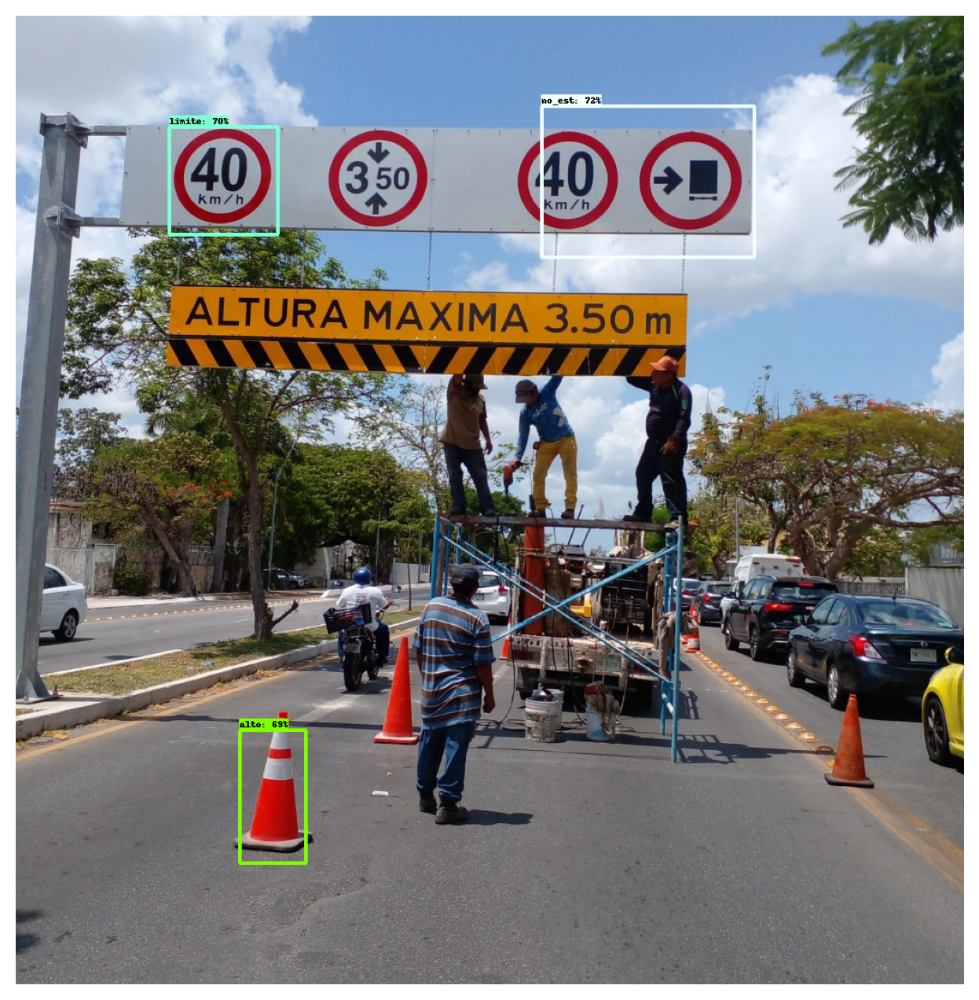

In [ ]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

IMAGE_SIZE = (12, 8)
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/content/gdrive/MyDrive/TSR/Data/inference_graph100/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/content/gdrive/MyDrive/TSR/Data/label_map.pbtxt",use_display_name=True)


def load_image_into_numpy_array(path):

    return np.array(Image.open(path))

image_path = "/content/gdrive/MyDrive/TSR/Data/test_images/test6.jpg"


image_np = load_image_into_numpy_array(image_path)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image_np)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.6, # Adjust this value to set the minimum probability boxes to be classified as True
      agnostic_mode=False)
%matplotlib inline
plt.figure(figsize=IMAGE_SIZE, dpi=200)
plt.axis("off")
plt.imshow(image_np_with_detections)
plt.show()